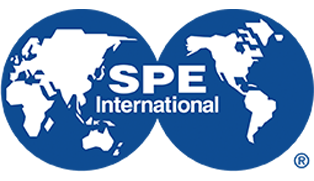

## **SPE Data Science and Engineering Analytics Technical Section (DSEAT) Africa Datathon Challenge**

**By: Ashinze Emmanuel Chidi**

**Department of Chemical Engineering,**

**University of Lagos.**

The SPE Data Science and Engineering Analytics Technical Section (DSEAT) Africa Datathon
Challenge presents an exciting opportunity for participants to harness the power of machine
learning to address real-world challenges in the oil and gas industry. Organized by the Society
of Petroleum Engineers (SPE) Data Science and Engineering Analytics Technical Section
(DSEAT) Africa, this challenge aims to leverage historical production data to predict future
production performance

**OBJECTIVES**

Develop a machine learning model to predict oil, gas, and water production
based on historical records.

By analysing past production data and associated parameters, participants should apply the
standard machine learning (ML) workflow to accurately forecast production profile of the oil,
gas, and water

Evaluation Criteria: Submissions will be evaluated based on the accuracy and reliability
of their predictions, as well as the creativity and effectiveness of the machine learning
approaches employed.









**INTRODUCTION**

**Dataset:**

The production data provided is a DSEATS conceptual oil field with historical production
information such as Well Code, Field Name, Downhole Pressure, Tubing Head Pressure, Choke
Size et cetera.

(Units are in Field Units).
We are given two data files:

1) Training dataset

2) Validation dataset

Using the features in the training dataset, participants are expected to develop their best
machine learning model and then use this to predict or forecast the oil, gas, and water
production in the validation dataset.


**Description:**

The dataset collects daily production data from the oil well, it has 13 columns and 6925 rows. The column descriptions are as follows.

**`PRODUCTION DATE`**: The date for which the production data is recorded. The data spans from '2014-04-07' to '2016-03-14'.

**`WELL_BORE_CODE:`** A unique code identifying each well bore. It appears to be a combination of the field name ('DSEAT'), a sequence number, and potentially additional characters. Examples include 'DSEAT-001-F-1 C' and 'DSEAT-001-F-1 B'.

**`N_WELL_BORE_CODE:`** A numerical code corresponding to the WELL_BORE_CODE. It seems to be a simplified version of the WELL_BORE_CODE, likely for easier reference. Examples include 105, 106, 107, etc.

**`WellBore Name:`** A name for the well bore, similar to the WELL_BORE_CODE but without the 'DSEAT-' prefix. Examples include '001-F-1 C' and '001-F-1 B'.
Categorical Variables


**`Field Name:`** The name of the oil field. In this dataset, all records belong to the 'DSEAT' field.

**`FLOW_KIND:`** The type of flow, which is consistently 'production' in this dataset.

**`WELL_TYPE:`** The type of well. The vast majority are 'OP' (Oil Producer), with only one instance of 'WI' (Water Injector).

**`Downhole Pressure (PSI):`** The pressure at the bottom of the well, measured in pounds per square inch (PSI). This is a key indicator of well health and reservoir pressure. The values in the dataset range from 0 to 4606.67 PSI, with a mean of 2587.48 PSI.

**`Downhole Temperature (Kelvin):`** The temperature at the bottom of the well, measured in Kelvin. This can provide insights into the geothermal gradient and reservoir conditions. The values range from 273.15 K (0 degrees Celsius) to 381.652 K, with a mean of 349.675 K.

**`Average Tubing Pressure: `**The average pressure inside the production tubing, measured in PSI. This is important for monitoring flow assurance and well performance. The values range from 0 to 4592.61 PSI, with a mean of 2161.99 PSI.

**`Annulus Pressure (PSI):`** The pressure in the annulus, the space between the production tubing and the well casing. This is monitored for well integrity and safety. The values range from 0 to 435.288 PSI, with a mean of 180.369 PSI.

**`AVG WHP (PSI):`** The average wellhead pressure, measured in PSI. This is the pressure at the surface and is a critical parameter for production operations. The values range from 0 to 1991.01 PSI, with a mean of 716.577 PSI.

**`Choke Size:`** The size of the choke, a valve used to control the flow rate of the well. The values range from 0 to 125.719, with a mean of 21.8646. There are 6 missing values in this column.

**`Oil Production (stb/day):`** The daily production of oil, measured in stock tank barrels (stb). This is the primary output of an oil well. The values range from 0 to 37122.6 stb/day, with a mean of 8494.77 stb/day.

**`Gas Volume (scf/day):`** The daily production of gas, measured in standard cubic feet (scf). This is often a byproduct of oil production. The values range from 0 to 3.00449e+07 scf/day, with a mean of 6.97869e+06 scf/day.

**`Water Production (stb/day):`** The daily production of water, measured in stock tank barrels (stb). Water is often produced along with oil and gas. The values range from -2879.81 to 50444.2 stb/day, with a mean of 11480.6 stb/day. The negative value is unusual and might indicate an error in the data.


In [177]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn

In [178]:
!gdown --id 1xI-F7-zTPwkS8Rqjz6Vyed20RBvRb5T2
!gdown --id 1L6oDS-sL40eStJTGxBXxvwgrlET3tHiP

/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1xI-F7-zTPwkS8Rqjz6Vyed20RBvRb5T2
To: /content/dseats_2024_training_dataset.csv
100% 1.11M/1.11M [00:00<00:00, 116MB/s]
/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1L6oDS-sL40eStJTGxBXxvwgrlET3tHiP
To: /content/dseats_2024_validation_dataset.csv
100% 420k/420k [00:00<00:00, 98.7MB/s]


In [179]:
train_df = pd.read_csv('/content/dseats_2024_training_dataset.csv')
test_df = pd.read_csv('/content/dseats_2024_validation_dataset.csv')

In [180]:
train_df.head(20)

,PRODUCTION DATE,Field Name,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,FLOW_KIND,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day)
0,07/04/2014 00:00,DSEAT,DSEAT-001-F-1 C,105,001-F-1 C,production,OP,0.000000,273.150000,0.000000,0.0,0.000000,0.000000,0.0000,0.000,0.0
1,08/04/2014 00:00,DSEAT,DSEAT-001-F-1 C,105,001-F-1 C,production,OP,0.000000,273.150000,0.000000,0.0,0.000000,0.000000,0.0000,0.000,0.0
2,09/04/2014 00:00,DSEAT,DSEAT-001-F-1 C,105,001-F-1 C,production,OP,0.000000,273.150000,0.000000,0.0,0.000000,0.000000,0.0000,0.000,0.0
3,10/04/2014 00:00,DSEAT,DSEAT-001-F-1 C,105,001-F-1 C,production,OP,0.000000,273.150000,0.000000,0.0,0.000000,0.000000,0.0000,0.000,0.0
4,11/04/2014 00:00,DSEAT,DSEAT-001-F-1 C,105,001-F-1 C,production,OP,4500.454030,370.025890,4020.534770,0.0,479.919260,33.071950,0.0000,0.000,0.0
5,12/04/2014 00:00,DSEAT,DSEAT-001-F-1 C,105,001-F-1 C,production,OP,4400.761310,370.073390,4080.987880,0.0,319.773430,22.053340,0.0000,0.000,0.0
6,13/04/2014 00:00,DSEAT,DSEAT-001-F-1 C,105,001-F-1 C,production,OP,4401.254745,370.108850,4002.464000,0.0,398.790745,16.163260,0.0000,0.000,0.0
7,14/04/2014 00:00,DSEAT,DSEAT-001-F-1 C,105,001-F-1 C,production,OP,4404.843060,370.118730,4100.408020,0.0,304.435040,20.737120,0.0000,0.000,0.0
8,15/04/2014 00:00,DSEAT,DSEAT-001-F-1 C,105,001-F-1 C,production,OP,4405.944045,370.171360,4204.139715,0.0,201.804330,12.181530,0.0000,0.000,0.0
9,16/04/2014 00:00,DSEAT,DSEAT-001-F-1 C,105,001-F-1 C,production,OP,4404.982115,370.215690,4345.242985,0.0,59.739130,1.490200,0.0000,0.000,0.0


In [181]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6925 entries, 0 to 6924
Data columns (total 16 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   PRODUCTION DATE                6925 non-null   object 
 1   Field Name                     6925 non-null   object 
 2   WELL_BORE_CODE                 6925 non-null   object 
 3   N_WELL_BORE_CODE               6925 non-null   int64  
 4   WellBore Name                  6925 non-null   object 
 5   FLOW_KIND                      6925 non-null   object 
 6   WELL_TYPE                      6925 non-null   object 
 7   Downhole Pressure (PSI)        6925 non-null   float64
 8   Downhole Temperature (Kelvin)  6925 non-null   float64
 9   Average Tubing Pressure        6925 non-null   float64
 10  Annulus Pressure (PSI)         6925 non-null   float64
 11  AVG WHP (PSI)                  6925 non-null   float64
 12  Choke Size                     6919 non-null   f

In [182]:
df = train_df.copy()

In [183]:
df.describe(include ='all')

,PRODUCTION DATE,Field Name,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,FLOW_KIND,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day)
count,6925,6925,6925,6925.000000,6925,6925,6925,6925.000000,6925.000000,6925.000000,6925.000000,6925.000000,6919.000000,6925.000000,6.925000e+03,6925.000000
unique,2611,1,5,NaN,5,1,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,07/04/2014 00:00,DSEAT,DSEAT-001-F-12 H,NaN,001-F-12,production,OP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,5,6925,2611,NaN,2611,6925,6924,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,107.297040,NaN,NaN,NaN,2587.482923,349.674794,2161.986343,180.369383,716.576882,21.864557,8494.774524,6.978690e+06,11480.559310
std,NaN,NaN,NaN,0.980161,NaN,NaN,NaN,1588.474034,46.240823,1053.875029,139.771514,347.859953,22.300691,8927.596731,7.100875e+06,11484.481008
min,NaN,NaN,NaN,105.000000,NaN,NaN,NaN,0.000000,273.150000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,-2879.813600
25%,NaN,NaN,NaN,107.000000,NaN,NaN,NaN,0.000000,273.150000,896.612291,0.000000,476.539814,4.631982,1686.600600,1.434288e+06,80.323300
50%,NaN,NaN,NaN,107.000000,NaN,NaN,NaN,3378.397358,376.911370,2472.031527,213.091127,619.647824,14.301660,5479.470600,4.770461e+06,5529.413200
75%,NaN,NaN,NaN,108.000000,NaN,NaN,NaN,3664.905359,379.496193,2907.047474,300.356843,903.890487,31.529768,11730.472600,9.892230e+06,22261.505100


In [184]:
pip install ydata-profiling

In [185]:
from ydata_profiling import ProfileReport

In [186]:
profile = ProfileReport(df)

In [187]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [188]:
profile.to_file("report.html")

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:363: UserWarning:

Try running command: 'pip install --upgrade Pillow' to avoid ValueError



Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [189]:
df['PRODUCTION DATE'] = pd.to_datetime(df['PRODUCTION DATE'], format="%d/%m/%Y %H:%M")
#test_df['PRODUCTION DATE'] = pd.to_datetime(test_df['PRODUCTION DATE'], format="%d/%m/%Y %H:%M")

In [190]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6925 entries, 0 to 6924
Data columns (total 16 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   PRODUCTION DATE                6925 non-null   datetime64[ns]
 1   Field Name                     6925 non-null   object        
 2   WELL_BORE_CODE                 6925 non-null   object        
 3   N_WELL_BORE_CODE               6925 non-null   int64         
 4   WellBore Name                  6925 non-null   object        
 5   FLOW_KIND                      6925 non-null   object        
 6   WELL_TYPE                      6925 non-null   object        
 7   Downhole Pressure (PSI)        6925 non-null   float64       
 8   Downhole Temperature (Kelvin)  6925 non-null   float64       
 9   Average Tubing Pressure        6925 non-null   float64       
 10  Annulus Pressure (PSI)         6925 non-null   float64       
 11  AVG WHP (PSI)    

### **UNIVARIATE ANALYSIS**

PRODUCTION DATE

In [191]:
df['PRODUCTION DATE'].describe()

count                             6925
mean     2012-07-04 23:09:15.725631744
min                2008-02-12 00:00:00
25%                2010-07-04 00:00:00
50%                2013-01-20 00:00:00
75%                2014-07-19 00:00:00
max                2015-06-30 00:00:00
Name: PRODUCTION DATE, dtype: object

The date for which the production data is recorded. The data spans from '2014-04-07' to '2016-03-14'.

WELL BORE CODE

In [192]:
df.WELL_BORE_CODE.value_counts()

WELL_BORE_CODE
DSEAT-001-F-12 H    2611
DSEAT-001-F-14 H    2611
DSEAT-001-F-11 H     720
DSEAT-001-F-15 D     533
DSEAT-001-F-1 C      450
Name: count, dtype: int64

<Axes: xlabel='WELL_BORE_CODE'>

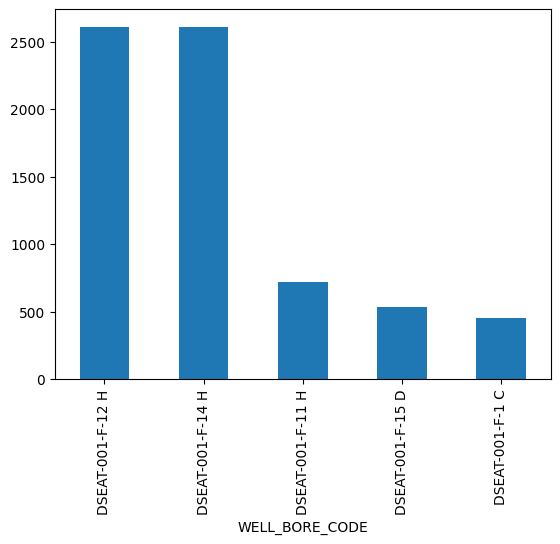

In [193]:
df.WELL_BORE_CODE.value_counts().plot(kind='bar')

This section shows the exact count of occurrences for each unique WELL_BORE_CODE. There are five distinct well bore codes, with 'DSEAT-001-F-12 H' and 'DSEAT-001-F-14 H' being the most frequent, each appearing 2611 times. 'DSEAT-001-F-11 H' follows with 720 occurrences, while 'DSEAT-001-F-15 D' and 'DSEAT-001-F-1 C' have 533 and 450 occurrences, respectively.

N WELLBORE CODE

In [194]:
df.N_WELL_BORE_CODE.value_counts()

N_WELL_BORE_CODE
107    2611
108    2611
106     720
109     533
105     450
Name: count, dtype: int64

<Axes: xlabel='N_WELL_BORE_CODE'>

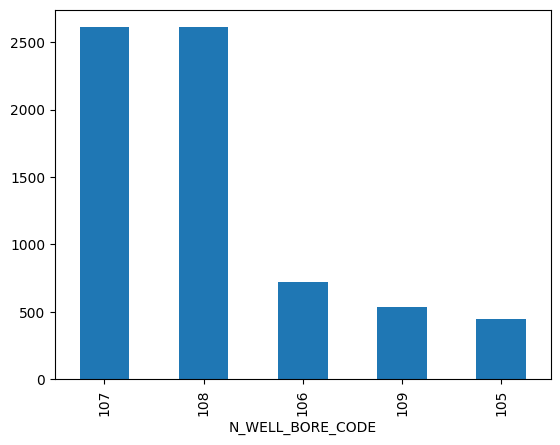

In [195]:
df.N_WELL_BORE_CODE.value_counts().plot(kind='bar')

This section displays the exact frequency (count) of each unique N_WELL_BORE_CODE. There are five distinct codes (105, 106, 107, 108, and 109) in the dataset. The codes 107 and 108 are the most frequent, each occurring 2611 times. The remaining codes are less common, with frequencies of 720 (106), 533 (109), and 450 (105)

WELL BORE NAME

In [196]:
df['WellBore Name'].value_counts()

WellBore Name
001-F-12      2611
001-F-14      2611
001-F-11       720
001-F-15 D     533
001-F-1 C      450
Name: count, dtype: int64

<Axes: xlabel='WellBore Name'>

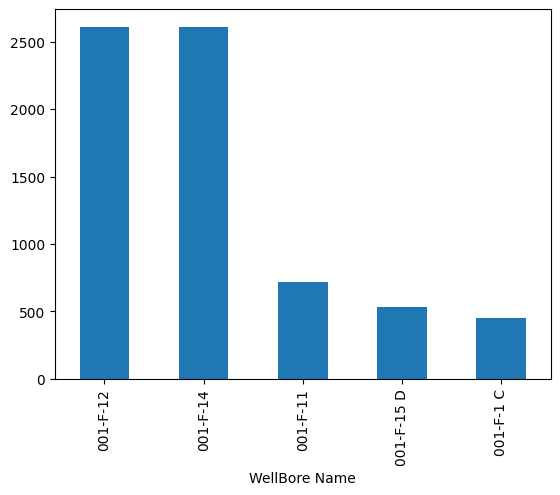

In [197]:
df['WellBore Name'].value_counts().plot(kind="bar")

This section displays the exact count of occurrences for each unique WellBore Name. There are five distinct well bore names in the dataset: '001-F-12', '001-F-14', '001-F-11', '001-F-15 D', and '001-F-1 C'. The names '001-F-12' and '001-F-14' are the most frequent, each appearing 2611 times. The remaining names are less common, with frequencies of 720 ('001-F-11'), 533 ('001-F-15 D'), and 450 ('001-F-1 C').

FLOWKIND


In [ ]:
df.FLOW_KIND.value_counts()

FLOW_KIND
production    6925
Name: count, dtype: int64

The dataset only has production kind for flow.

WELL TYPE

In [ ]:
df.WELL_TYPE.value_counts()

WELL_TYPE
OP    6924
WI       1
Name: count, dtype: int64

<Axes: xlabel='WELL_TYPE'>

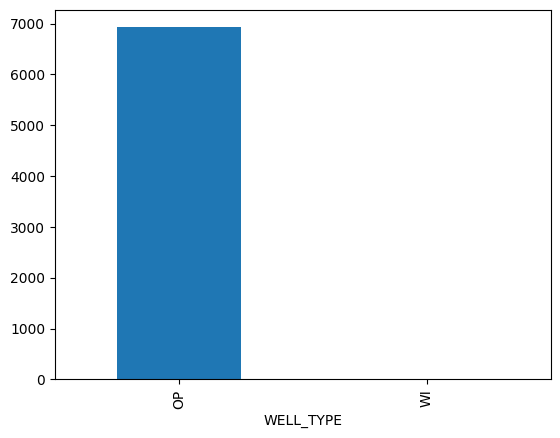

In [ ]:
df.WELL_TYPE.value_counts().plot(kind='bar')

OP: This category appears 6924 times and likely stands for 'Oil Producer'.
WI: This category appears only once and likely stands for 'Water Injector'.
Given the extreme imbalance in the frequencies, it's unlikely that the single 'WI' well will provide meaningful insights in the analysis compared to the dominant 'OP' wells.

In [ ]:
test_df.describe(include='all')

,PRODUCTION DATE,Field Name,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,FLOW_KIND,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day)
count,2075,2075,2075,2075.000000,2075,2075,2075,2075.000000,2075.000000,2075.000000,2075.000000,2075.000000,2075.000000,0.0,0.0,0.0
unique,445,1,5,NaN,5,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,2015-07-01 00:00:00,DSEAT,DSEAT-001-F-11 H,NaN,001-F-11,production,OP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,5,2075,445,NaN,445,2075,2075,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,107.142651,NaN,NaN,NaN,2770.769569,351.655653,2447.863733,197.054017,487.723448,11.566877,NaN,NaN,NaN
std,NaN,NaN,NaN,1.354975,NaN,NaN,NaN,1604.414730,44.088178,1279.839703,119.151822,337.834866,21.912249,NaN,NaN,NaN
min,NaN,NaN,NaN,105.000000,NaN,NaN,NaN,0.000000,273.150000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN
25%,NaN,NaN,NaN,106.000000,NaN,NaN,NaN,2899.657187,363.184330,2352.860553,131.693688,385.785438,1.533683,NaN,NaN,NaN
50%,NaN,NaN,NaN,107.000000,NaN,NaN,NaN,3364.224336,374.267440,2736.140974,219.994048,417.627583,3.402087,NaN,NaN,NaN
75%,NaN,NaN,NaN,108.000000,NaN,NaN,NaN,3864.667975,379.090599,3417.707239,296.054719,464.401766,9.161726,NaN,NaN,NaN


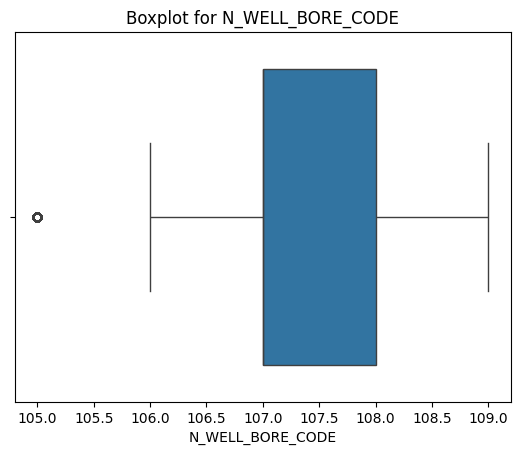

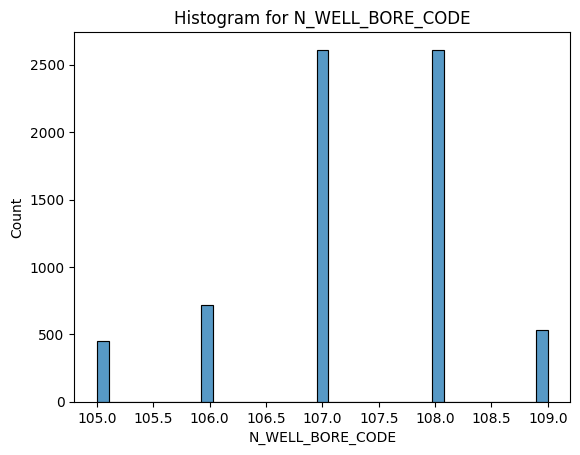

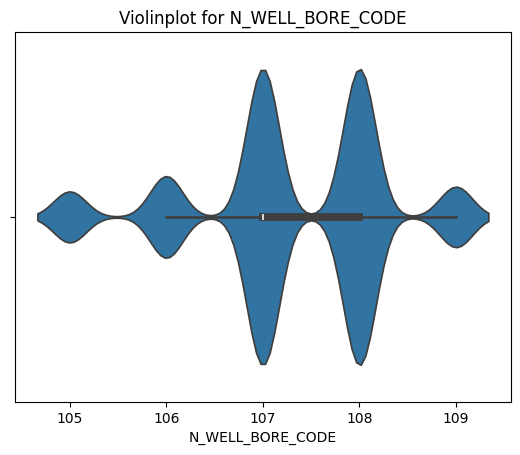

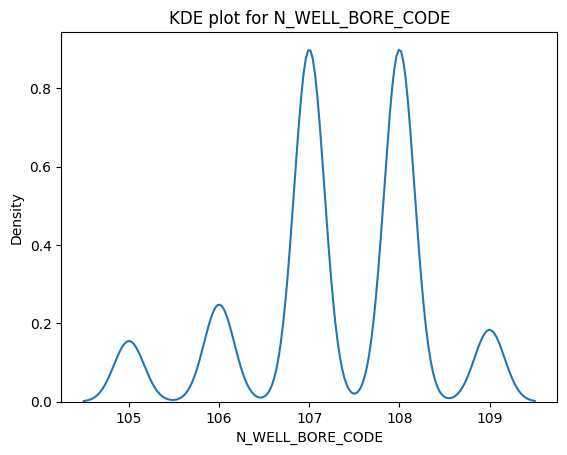

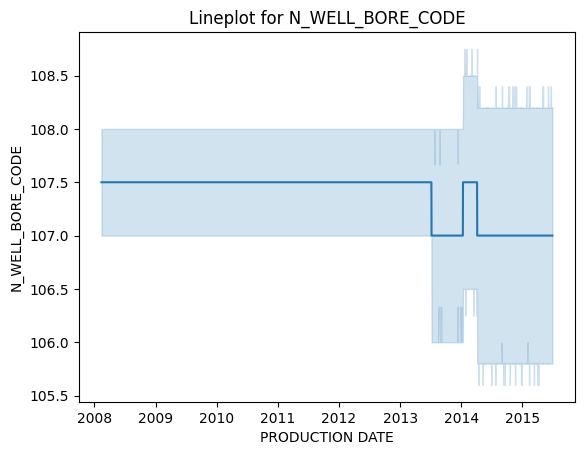

...

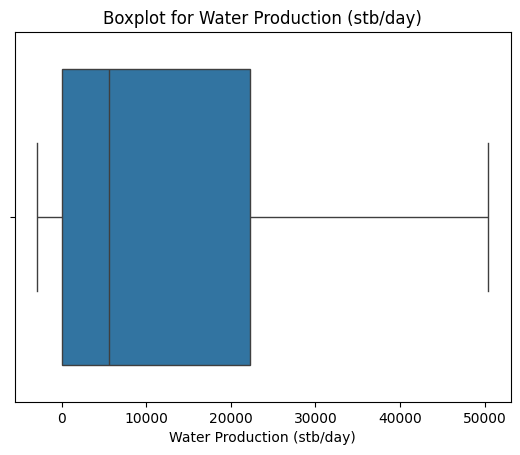

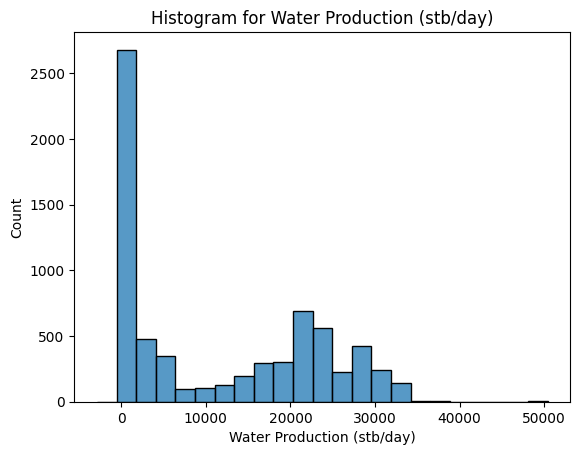

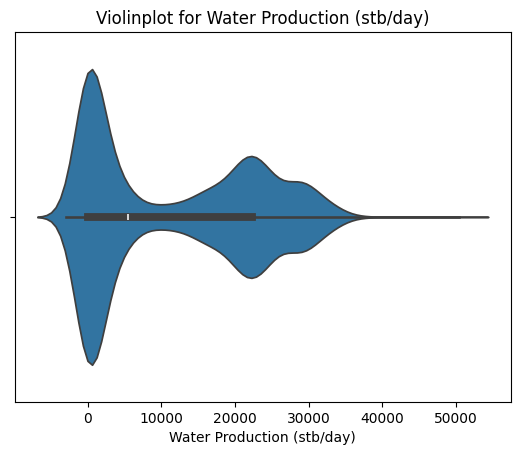

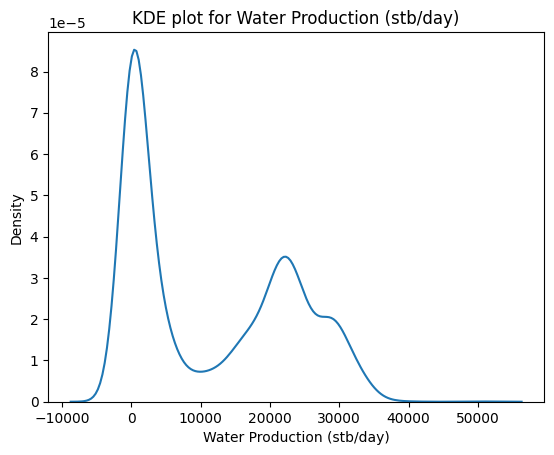

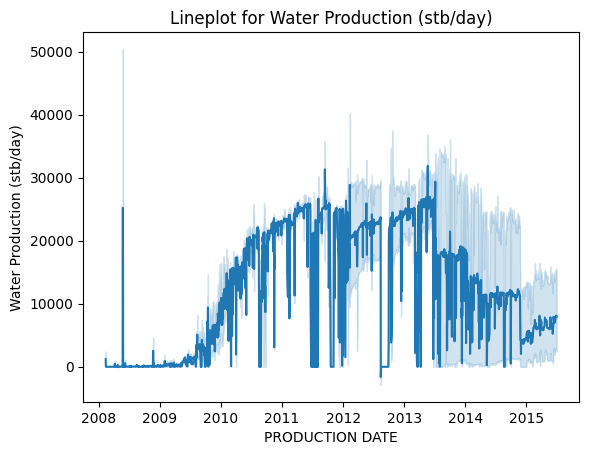

In [ ]:
# Extract numeric columns
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns

# Create a boxplot for each numeric column
for col in numeric_cols:
    sns.boxplot(x=col, data=df)
    plt.title(f'Boxplot for {col}')
    plt.show()

    sns.histplot(x=col,data=df)
    plt.title(f'Histogram for {col}')
    plt.show()

    sns.violinplot(x=col,data=df)
    plt.title(f'Violinplot for {col}')
    plt.show()

    sns.kdeplot(x=col,data=df)
    plt.title(f'KDE plot for {col}')
    plt.show()

    sns.lineplot(x='PRODUCTION DATE',y=col,data=df)
    plt.title(f'Lineplot for {col}')
    plt.show()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6925 entries, 0 to 6924
Data columns (total 16 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   PRODUCTION DATE                6925 non-null   datetime64[ns]
 1   Field Name                     6925 non-null   object        
 2   WELL_BORE_CODE                 6925 non-null   object        
 3   N_WELL_BORE_CODE               6925 non-null   int64         
 4   WellBore Name                  6925 non-null   object        
 5   FLOW_KIND                      6925 non-null   object        
 6   WELL_TYPE                      6925 non-null   object        
 7   Downhole Pressure (PSI)        6925 non-null   float64       
 8   Downhole Temperature (Kelvin)  6925 non-null   float64       
 9   Average Tubing Pressure        6925 non-null   float64       
 10  Annulus Pressure (PSI)         6925 non-null   float64       
 11  AVG WHP (PSI)    

In [ ]:
import plotly.express as px

# Interactive time series plot
fig = px.line(df, x='PRODUCTION DATE', y='Oil Production (stb/day)',  title='Interactive Daily Oil Production')
fig.update_xaxes(title='Date Surveyed')
fig.update_yaxes(title='Daily Oil Production')
fig.show()

In [ ]:
import plotly.express as px

# Interactive time series plot
fig = px.line(df, x='PRODUCTION DATE', y='Gas Volume (scf/day)',  title='Interactive Daily Gas Volume (scf/day)')
fig.update_xaxes(title='Date Surveyed')
fig.update_yaxes(title='Gas Volume (scf/day)')
fig.show()

In [ ]:
import plotly.express as px

# Interactive time series plot
fig = px.line(df, x='PRODUCTION DATE', y='Water Production (stb/day)',  title='Interactive Daily Water Production (stb/day)')
fig.update_xaxes(title='Date Surveyed')
fig.update_yaxes(title='Water Production (stb/day)')
fig.show()

From the Univariate analysis, most of the variables follow a similar trend of increasing and reducing afterwards. There is prescence of outliers in the Oil and Gas production, Choke size and prescence of days with zero productions. Based on these , many features will be engineered. Also, the missing values of the Choke size will be addressed and models compared and aggregated.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6925 entries, 0 to 6924
Data columns (total 16 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   PRODUCTION DATE                6925 non-null   datetime64[ns]
 1   Field Name                     6925 non-null   object        
 2   WELL_BORE_CODE                 6925 non-null   object        
 3   N_WELL_BORE_CODE               6925 non-null   int64         
 4   WellBore Name                  6925 non-null   object        
 5   FLOW_KIND                      6925 non-null   object        
 6   WELL_TYPE                      6925 non-null   object        
 7   Downhole Pressure (PSI)        6925 non-null   float64       
 8   Downhole Temperature (Kelvin)  6925 non-null   float64       
 9   Average Tubing Pressure        6925 non-null   float64       
 10  Annulus Pressure (PSI)         6925 non-null   float64       
 11  AVG WHP (PSI)    

In [ ]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9920 entries, 0 to 9919
Data columns (total 16 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   PRODUCTION DATE                2075 non-null   object 
 1   Field Name                     2075 non-null   object 
 2   WELL_BORE_CODE                 2075 non-null   object 
 3   N_WELL_BORE_CODE               2075 non-null   float64
 4   WellBore Name                  2075 non-null   object 
 5   FLOW_KIND                      2075 non-null   object 
 6   WELL_TYPE                      2075 non-null   object 
 7   Downhole Pressure (PSI)        2075 non-null   float64
 8   Downhole Temperature (Kelvin)  2075 non-null   float64
 9   Average Tubing Pressure        2075 non-null   float64
 10  Annulus Pressure (PSI)         2075 non-null   float64
 11  AVG WHP (PSI)                  2075 non-null   float64
 12  Choke Size                     2075 non-null   f

In [ ]:
# Select only numerical columns before calculating correlations
numerical_df = df.select_dtypes(include=['number'])
correlation_matrix = numerical_df.corr()
correlation_matrix
#print(correlation_matrix)

,N_WELL_BORE_CODE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day)
N_WELL_BORE_CODE,1.000000,0.107050,0.121245,0.144271,-0.046946,-0.186169,-0.222072,0.024403,0.023477,0.147892
Downhole Pressure (PSI),0.107050,1.000000,0.976292,0.950710,-0.185430,0.322986,0.270540,0.318232,0.316191,-0.378980
Downhole Temperature (Kelvin),0.121245,0.976292,1.000000,0.914867,-0.186245,0.301547,0.224738,0.339666,0.336812,-0.429728
Average Tubing Pressure,0.144271,0.950710,0.914867,1.000000,-0.137008,0.181183,0.123248,0.203944,0.202959,-0.250208
Annulus Pressure (PSI),-0.046946,-0.185430,-0.186245,-0.137008,1.000000,-0.086250,-0.221631,-0.092136,-0.089360,0.222422
AVG WHP (PSI),-0.186169,0.322986,0.301547,0.181183,-0.086250,1.000000,0.905820,0.427988,0.426122,-0.447215
Choke Size,-0.222072,0.270540,0.224738,0.123248,-0.221631,0.905820,1.000000,0.288396,0.283179,-0.589275
Oil Production (stb/day),0.024403,0.318232,0.339666,0.203944,-0.092136,0.427988,0.288396,1.000000,0.998425,-0.206238
Gas Volume (scf/day),0.023477,0.316191,0.336812,0.202959,-0.089360,0.426122,0.283179,0.998425,1.000000,-0.189390
Water Production (stb/day),0.147892,-0.378980,-0.429728,-0.250208,0.222422,-0.447215,-0.589275,-0.206238,-0.189390,1.000000


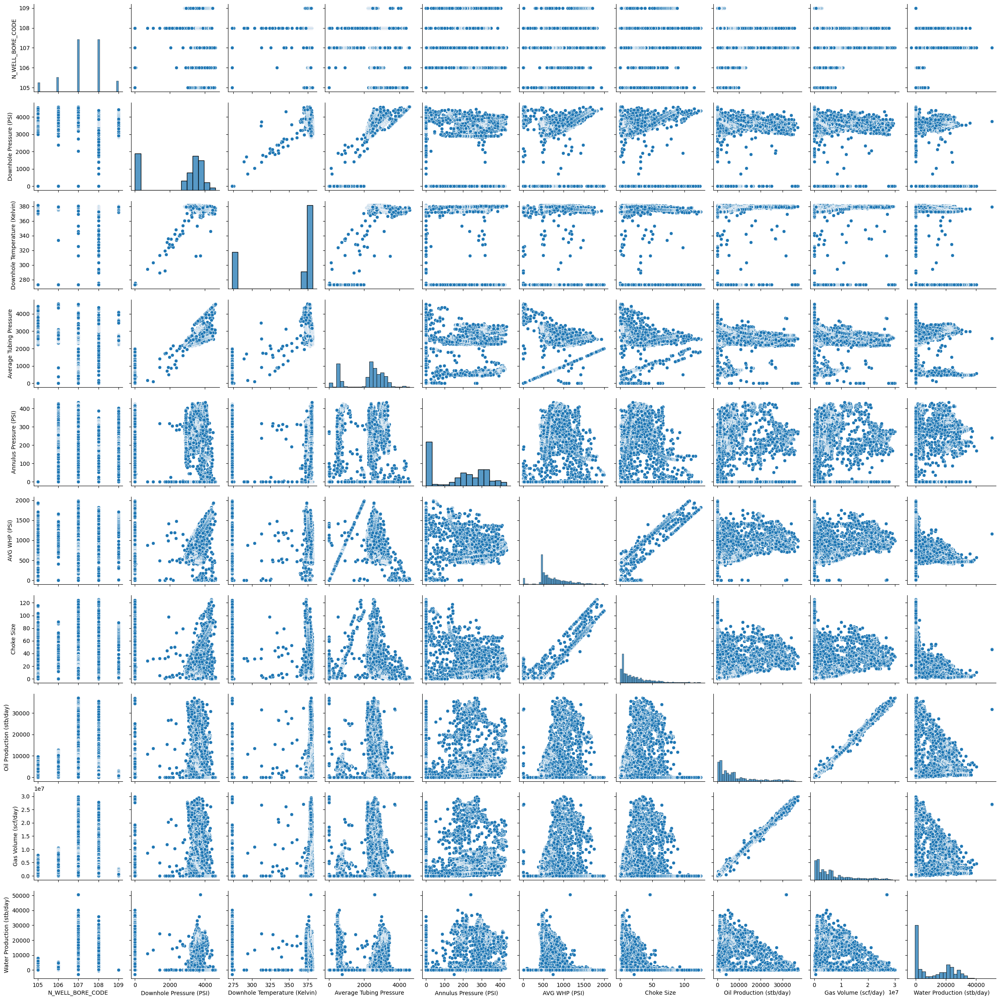

In [ ]:
sns.pairplot(df)

In [ ]:
df.describe(include='all')

,PRODUCTION DATE,Field Name,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,FLOW_KIND,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day)
count,6925,6925,6925,6925.000000,6925,6925,6925,6925.000000,6925.000000,6925.000000,6925.000000,6925.000000,6919.000000,6925.000000,6.925000e+03,6925.000000
unique,NaN,1,5,NaN,5,1,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,DSEAT,DSEAT-001-F-12 H,NaN,001-F-12,production,OP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,6925,2611,NaN,2611,6925,6924,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,2012-07-04 23:09:15.725631744,NaN,NaN,107.297040,NaN,NaN,NaN,2587.482923,349.674794,2161.986343,180.369383,716.576882,21.864557,8494.774524,6.978690e+06,11480.559310
min,2008-02-12 00:00:00,NaN,NaN,105.000000,NaN,NaN,NaN,0.000000,273.150000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,-2879.813600
25%,2010-07-04 00:00:00,NaN,NaN,107.000000,NaN,NaN,NaN,0.000000,273.150000,896.612291,0.000000,476.539814,4.631982,1686.600600,1.434288e+06,80.323300
50%,2013-01-20 00:00:00,NaN,NaN,107.000000,NaN,NaN,NaN,3378.397358,376.911370,2472.031527,213.091127,619.647824,14.301660,5479.470600,4.770461e+06,5529.413200
75%,2014-07-19 00:00:00,NaN,NaN,108.000000,NaN,NaN,NaN,3664.905359,379.496193,2907.047474,300.356843,903.890487,31.529768,11730.472600,9.892230e+06,22261.505100
max,2015-06-30 00:00:00,NaN,NaN,109.000000,NaN,NaN,NaN,4606.666675,381.652178,4592.612695,435.287508,1991.009935,125.718570,37122.573600,3.004494e+07,50444.164600


In [ ]:
test_df.describe(include='all')

,PRODUCTION DATE,Field Name,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,FLOW_KIND,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day)
count,2075,2075,2075,2075.000000,2075,2075,2075,2075.000000,2075.000000,2075.000000,2075.000000,2075.000000,2075.000000,0.0,0.0,0.0
unique,445,1,5,NaN,5,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,2015-07-01 00:00:00,DSEAT,DSEAT-001-F-11 H,NaN,001-F-11,production,OP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,5,2075,445,NaN,445,2075,2075,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,107.142651,NaN,NaN,NaN,2770.769569,351.655653,2447.863733,197.054017,487.723448,11.566877,NaN,NaN,NaN
std,NaN,NaN,NaN,1.354975,NaN,NaN,NaN,1604.414730,44.088178,1279.839703,119.151822,337.834866,21.912249,NaN,NaN,NaN
min,NaN,NaN,NaN,105.000000,NaN,NaN,NaN,0.000000,273.150000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN
25%,NaN,NaN,NaN,106.000000,NaN,NaN,NaN,2899.657187,363.184330,2352.860553,131.693688,385.785438,1.533683,NaN,NaN,NaN
50%,NaN,NaN,NaN,107.000000,NaN,NaN,NaN,3364.224336,374.267440,2736.140974,219.994048,417.627583,3.402087,NaN,NaN,NaN
75%,NaN,NaN,NaN,108.000000,NaN,NaN,NaN,3864.667975,379.090599,3417.707239,296.054719,464.401766,9.161726,NaN,NaN,NaN


In [ ]:


df[df['Water Production (stb/day)'] < 0]


,PRODUCTION DATE,Field Name,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,FLOW_KIND,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day)
1241,2008-04-23,DSEAT,DSEAT-001-F-12 H,107,001-F-12,production,OP,3778.090061,378.921069,2446.120354,159.654201,1331.969707,60.253108,17206.4837,1.490066e+07,-89.2551
2761,2012-08-13,DSEAT,DSEAT-001-F-12 H,107,001-F-12,production,OP,0.000000,273.150000,738.789964,149.643422,738.789964,21.297284,3981.3184,4.279550e+05,-2879.8136
4164,2009-03-03,DSEAT,DSEAT-001-F-14 H,108,001-F-14,production,OP,3919.223637,378.613575,2440.423694,0.000000,1478.799943,68.800869,27293.1277,2.174814e+07,-5.9755
5372,2012-08-13,DSEAT,DSEAT-001-F-14 H,108,001-F-14,production,OP,3666.939046,375.036570,2997.727129,214.782410,669.211917,17.203700,1273.9137,1.325204e+05,-372.3051


In [ ]:


df[df['Choke Size'].isnull()]


,PRODUCTION DATE,Field Name,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,FLOW_KIND,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day)
452,2013-07-10,DSEAT,DSEAT-001-F-11 H,106,001-F-11,production,OP,0.0,273.15,0.0,0.0,0.0,NaN,0.0000,0.000,0.0
454,2013-07-12,DSEAT,DSEAT-001-F-11 H,106,001-F-11,production,OP,0.0,273.15,0.0,0.0,0.0,NaN,0.0000,0.000,0.0
465,2013-07-23,DSEAT,DSEAT-001-F-11 H,106,001-F-11,production,OP,0.0,273.15,0.0,0.0,0.0,NaN,0.0000,0.000,0.0
468,2013-07-26,DSEAT,DSEAT-001-F-11 H,106,001-F-11,production,OP,0.0,273.15,0.0,0.0,0.0,NaN,5607.4092,4637945.215,0.0
469,2013-07-27,DSEAT,DSEAT-001-F-11 H,106,001-F-11,production,OP,0.0,273.15,0.0,0.0,0.0,NaN,5575.5818,4751970.216,0.0
472,2013-07-30,DSEAT,DSEAT-001-F-11 H,106,001-F-11,production,OP,0.0,273.15,0.0,0.0,0.0,NaN,6493.6702,5502022.851,0.0


INSIGHTS AFTER ANALYSIS

1. Oil and Gas Production vary directly with eachother, there is a similar pattern with ChoKE Size and AVG WHP(PSI)

2. Prescence of Outliers

3. Misssing Values in Choke Size

4. Prescence of Unnecessary columns that needs to be dropped

5. New Features to be Engineered

6. Negative values with Water Production

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6925 entries, 0 to 6924
Data columns (total 16 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   PRODUCTION DATE                6925 non-null   datetime64[ns]
 1   Field Name                     6925 non-null   object        
 2   WELL_BORE_CODE                 6925 non-null   object        
 3   N_WELL_BORE_CODE               6925 non-null   int64         
 4   WellBore Name                  6925 non-null   object        
 5   FLOW_KIND                      6925 non-null   object        
 6   WELL_TYPE                      6925 non-null   object        
 7   Downhole Pressure (PSI)        6925 non-null   float64       
 8   Downhole Temperature (Kelvin)  6925 non-null   float64       
 9   Average Tubing Pressure        6925 non-null   float64       
 10  Annulus Pressure (PSI)         6925 non-null   float64       
 11  AVG WHP (PSI)    

In [199]:


df = df[~df['Choke Size'].isnull()]
df = df[df['Water Production (stb/day)'] >= 0]


In [200]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6915 entries, 0 to 6924
Data columns (total 16 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   PRODUCTION DATE                6915 non-null   datetime64[ns]
 1   Field Name                     6915 non-null   object        
 2   WELL_BORE_CODE                 6915 non-null   object        
 3   N_WELL_BORE_CODE               6915 non-null   int64         
 4   WellBore Name                  6915 non-null   object        
 5   FLOW_KIND                      6915 non-null   object        
 6   WELL_TYPE                      6915 non-null   object        
 7   Downhole Pressure (PSI)        6915 non-null   float64       
 8   Downhole Temperature (Kelvin)  6915 non-null   float64       
 9   Average Tubing Pressure        6915 non-null   float64       
 10  Annulus Pressure (PSI)         6915 non-null   float64       
 11  AVG WHP (PSI)         

In [201]:
df.to_csv('train.csv', index=False)

## **MODEL** **BUILDING**

In [202]:
train = pd.read_csv('train.csv')
test = pd.read_csv('dseats_2024_validation_dataset.csv')

In [203]:
test=test[~pd.isna(test["PRODUCTION DATE"])]

In [204]:
train["PRODUCTION DATE"]=pd.to_datetime(train["PRODUCTION DATE"],format='mixed')
test["PRODUCTION DATE"]=pd.to_datetime(test["PRODUCTION DATE"],format='mixed')

In [205]:
train["month"]=train["PRODUCTION DATE"].dt.month
test["month"]=test["PRODUCTION DATE"].dt.month

train["day of week"]=train["PRODUCTION DATE"].dt.dayofweek
test["day of week"]=test["PRODUCTION DATE"].dt.dayofweek

train["day of month"]=train["PRODUCTION DATE"].dt.day
test["day of month"]=test["PRODUCTION DATE"].dt.day

In [206]:
train.WELL_TYPE.value_counts()

WELL_TYPE
OP    6914
WI       1
Name: count, dtype: int64

In [207]:


train = train[train["WELL_TYPE"] == "OP"]


In [208]:
train.drop(["Field Name","WELL_TYPE","FLOW_KIND"], axis=1, inplace=True)
test.drop(["Field Name","WELL_TYPE","FLOW_KIND"], axis=1, inplace=True)
train.drop(["WELL_BORE_CODE"], axis=1, inplace=True)
test.drop(["WELL_BORE_CODE"], axis=1, inplace=True)

In [209]:
#train.drop(["N_WELL_BORE_CODE","WellBore Name"], axis=1, inplace=True)
#test.drop(["N_WELL_BORE_CODE","WellBore Name"], axis=1, inplace=True)


In [210]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6914 entries, 0 to 6914
Data columns (total 15 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   PRODUCTION DATE                6914 non-null   datetime64[ns]
 1   N_WELL_BORE_CODE               6914 non-null   int64         
 2   WellBore Name                  6914 non-null   object        
 3   Downhole Pressure (PSI)        6914 non-null   float64       
 4   Downhole Temperature (Kelvin)  6914 non-null   float64       
 5   Average Tubing Pressure        6914 non-null   float64       
 6   Annulus Pressure (PSI)         6914 non-null   float64       
 7   AVG WHP (PSI)                  6914 non-null   float64       
 8   Choke Size                     6914 non-null   float64       
 9   Oil Production (stb/day)       6914 non-null   float64       
 10  Gas Volume (scf/day)           6914 non-null   float64       
 11  Water Production (stb/

In [211]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2075 entries, 0 to 2074
Data columns (total 15 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   PRODUCTION DATE                2075 non-null   datetime64[ns]
 1   N_WELL_BORE_CODE               2075 non-null   float64       
 2   WellBore Name                  2075 non-null   object        
 3   Downhole Pressure (PSI)        2075 non-null   float64       
 4   Downhole Temperature (Kelvin)  2075 non-null   float64       
 5   Average Tubing Pressure        2075 non-null   float64       
 6   Annulus Pressure (PSI)         2075 non-null   float64       
 7   AVG WHP (PSI)                  2075 non-null   float64       
 8   Choke Size                     2075 non-null   float64       
 9   Oil Production (stb/day)       0 non-null      float64       
 10  Gas Volume (scf/day)           0 non-null      float64       
 11  Water Production (stb/

In [212]:
# Function to calculate pressure gradient
def calculate_pressure_gradient(df):
    return (df['Downhole Pressure (PSI)'] - df['AVG WHP (PSI)']) / df['Downhole Temperature (Kelvin)']

# Function to calculate temperature gradient
def calculate_temperature_gradient(df):
    return df['Downhole Temperature (Kelvin)'] - 273.15  # Assuming 273.15 K as reference temperature

# Adding calculated features to the dataframe
train['Pressure Gradient'] = calculate_pressure_gradient(train)
train['Temperature Gradient'] = calculate_temperature_gradient(train)

test['Pressure Gradient'] = calculate_pressure_gradient(test)
test['Temperature Gradient'] = calculate_temperature_gradient(test)

# Estimating flow rate using Choke Size and Pressures (simplified formula)
def estimate_flow_rate(df):
    # Simplified empirical formula for flow rate estimation
    return df['Choke Size'] * (df['Downhole Pressure (PSI)'] - df['AVG WHP (PSI)']) ** 0.5

test['Estimated Flow Rate'] = estimate_flow_rate(test)
train['Estimated Flow Rate'] = estimate_flow_rate(train)


In [213]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2075 entries, 0 to 2074
Data columns (total 18 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   PRODUCTION DATE                2075 non-null   datetime64[ns]
 1   N_WELL_BORE_CODE               2075 non-null   float64       
 2   WellBore Name                  2075 non-null   object        
 3   Downhole Pressure (PSI)        2075 non-null   float64       
 4   Downhole Temperature (Kelvin)  2075 non-null   float64       
 5   Average Tubing Pressure        2075 non-null   float64       
 6   Annulus Pressure (PSI)         2075 non-null   float64       
 7   AVG WHP (PSI)                  2075 non-null   float64       
 8   Choke Size                     2075 non-null   float64       
 9   Oil Production (stb/day)       0 non-null      float64       
 10  Gas Volume (scf/day)           0 non-null      float64       
 11  Water Production (stb/

In [214]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6914 entries, 0 to 6914
Data columns (total 18 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   PRODUCTION DATE                6914 non-null   datetime64[ns]
 1   N_WELL_BORE_CODE               6914 non-null   int64         
 2   WellBore Name                  6914 non-null   object        
 3   Downhole Pressure (PSI)        6914 non-null   float64       
 4   Downhole Temperature (Kelvin)  6914 non-null   float64       
 5   Average Tubing Pressure        6914 non-null   float64       
 6   Annulus Pressure (PSI)         6914 non-null   float64       
 7   AVG WHP (PSI)                  6914 non-null   float64       
 8   Choke Size                     6914 non-null   float64       
 9   Oil Production (stb/day)       6914 non-null   float64       
 10  Gas Volume (scf/day)           6914 non-null   float64       
 11  Water Production (stb/

In [215]:
train.drop(["Estimated Flow Rate"], axis=1, inplace=True)
test.drop(["Estimated Flow Rate"], axis=1, inplace=True)

In [216]:
train['is_weekend'] = (train['day of week'] >= 5).astype(int)
test['is_weekend'] = (test['day of week'] >= 5).astype(int)

In [217]:
train.head(10)

,PRODUCTION DATE,N_WELL_BORE_CODE,WellBore Name,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day),month,day of week,day of month,Pressure Gradient,Temperature Gradient,is_weekend
0,2014-04-07,105,001-F-1 C,0.000000,273.15000,0.000000,0.0,0.000000,0.00000,0.0,0.0,0.0,4,0,7,0.000000,0.00000,0
1,2014-04-08,105,001-F-1 C,0.000000,273.15000,0.000000,0.0,0.000000,0.00000,0.0,0.0,0.0,4,1,8,0.000000,0.00000,0
2,2014-04-09,105,001-F-1 C,0.000000,273.15000,0.000000,0.0,0.000000,0.00000,0.0,0.0,0.0,4,2,9,0.000000,0.00000,0
3,2014-04-10,105,001-F-1 C,0.000000,273.15000,0.000000,0.0,0.000000,0.00000,0.0,0.0,0.0,4,3,10,0.000000,0.00000,0
4,2014-04-11,105,001-F-1 C,4500.454030,370.02589,4020.534770,0.0,479.919260,33.07195,0.0,0.0,0.0,4,4,11,10.865550,96.87589,0
5,2014-04-12,105,001-F-1 C,4400.761310,370.07339,4080.987880,0.0,319.773430,22.05334,0.0,0.0,0.0,4,5,12,11.027510,96.92339,1
6,2014-04-13,105,001-F-1 C,4401.254745,370.10885,4002.464000,0.0,398.790745,16.16326,0.0,0.0,0.0,4,6,13,10.814289,96.95885,1
7,2014-04-14,105,001-F-1 C,4404.843060,370.11873,4100.408020,0.0,304.435040,20.73712,0.0,0.0,0.0,4,0,14,11.078629,96.96873,0
8,2014-04-15,105,001-F-1 C,4405.944045,370.17136,4204.139715,0.0,201.804330,12.18153,0.0,0.0,0.0,4,1,15,11.357280,97.02136,0
9,2014-04-16,105,001-F-1 C,4404.982115,370.21569,4345.242985,0.0,59.739130,1.49020,0.0,0.0,0.0,4,2,16,11.737058,97.06569,0


In [218]:
train['quarter'] = train['PRODUCTION DATE'].dt.quarter
test['quarter'] = test['PRODUCTION DATE'].dt.quarter

In [219]:
train['production_occurred'] = (train['Oil Production (stb/day)'] > 0).astype(int)
test['production_occurred'] = (test['Oil Production (stb/day)'] > 0).astype(int)
train['maintenance_day'] = (train['Oil Production (stb/day)'] == 0).astype(int)
test['maintenance_day'] = (test['Oil Production (stb/day)'] == 0).astype(int)

In [220]:
train.head(20)

,PRODUCTION DATE,N_WELL_BORE_CODE,WellBore Name,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),...,Water Production (stb/day),month,day of week,day of month,Pressure Gradient,Temperature Gradient,is_weekend,quarter,production_occurred,maintenance_day
0,2014-04-07,105,001-F-1 C,0.000000,273.150000,0.000000,0.0,0.000000,0.000000,0.0000,...,0.0,4,0,7,0.000000,0.000000,0,2,0,1
1,2014-04-08,105,001-F-1 C,0.000000,273.150000,0.000000,0.0,0.000000,0.000000,0.0000,...,0.0,4,1,8,0.000000,0.000000,0,2,0,1
2,2014-04-09,105,001-F-1 C,0.000000,273.150000,0.000000,0.0,0.000000,0.000000,0.0000,...,0.0,4,2,9,0.000000,0.000000,0,2,0,1
3,2014-04-10,105,001-F-1 C,0.000000,273.150000,0.000000,0.0,0.000000,0.000000,0.0000,...,0.0,4,3,10,0.000000,0.000000,0,2,0,1
4,2014-04-11,105,001-F-1 C,4500.454030,370.025890,4020.534770,0.0,479.919260,33.071950,0.0000,...,0.0,4,4,11,10.865550,96.875890,0,2,0,1
5,2014-04-12,105,001-F-1 C,4400.761310,370.073390,4080.987880,0.0,319.773430,22.053340,0.0000,...,0.0,4,5,12,11.027510,96.923390,1,2,0,1
6,2014-04-13,105,001-F-1 C,4401.254745,370.108850,4002.464000,0.0,398.790745,16.163260,0.0000,...,0.0,4,6,13,10.814289,96.958850,1,2,0,1
7,2014-04-14,105,001-F-1 C,4404.843060,370.118730,4100.408020,0.0,304.435040,20.737120,0.0000,...,0.0,4,0,14,11.078629,96.968730,0,2,0,1
8,2014-04-15,105,001-F-1 C,4405.944045,370.171360,4204.139715,0.0,201.804330,12.181530,0.0000,...,0.0,4,1,15,11.357280,97.021360,0,2,0,1
9,2014-04-16,105,001-F-1 C,4404.982115,370.215690,4345.242985,0.0,59.739130,1.490200,0.0000,...,0.0,4,2,16,11.737058,97.065690,0,2,0,1


In [221]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6914 entries, 0 to 6914
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   PRODUCTION DATE                6914 non-null   datetime64[ns]
 1   N_WELL_BORE_CODE               6914 non-null   int64         
 2   WellBore Name                  6914 non-null   object        
 3   Downhole Pressure (PSI)        6914 non-null   float64       
 4   Downhole Temperature (Kelvin)  6914 non-null   float64       
 5   Average Tubing Pressure        6914 non-null   float64       
 6   Annulus Pressure (PSI)         6914 non-null   float64       
 7   AVG WHP (PSI)                  6914 non-null   float64       
 8   Choke Size                     6914 non-null   float64       
 9   Oil Production (stb/day)       6914 non-null   float64       
 10  Gas Volume (scf/day)           6914 non-null   float64       
 11  Water Production (stb/

In [222]:
# Select only numerical columns before calculating correlations
numerical_df = train.select_dtypes(include=['number'])
correlation_matrix = numerical_df.corr()
correlation_matrix
#print(correlation_matrix)

,N_WELL_BORE_CODE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day),month,day of week,day of month,Pressure Gradient,Temperature Gradient,is_weekend,quarter,production_occurred,maintenance_day
N_WELL_BORE_CODE,1.000000,0.105384,0.119738,0.142285,-0.048881,-0.189312,-0.222386,0.023424,0.022487,0.146850,-0.028725,0.001355,0.000009,0.157975,0.119738,0.000920,-0.029255,0.079866,-0.079866
Downhole Pressure (PSI),0.105384,1.000000,0.976236,0.950665,-0.187554,0.320890,0.270342,0.317672,0.315543,-0.381191,0.042823,0.000042,0.003890,0.972244,0.976236,-0.001524,0.038633,0.076417,-0.076417
Downhole Temperature (Kelvin),0.119738,0.976236,1.000000,0.914683,-0.188377,0.299416,0.224581,0.339240,0.336296,-0.432114,0.028019,0.000873,-0.001085,0.952590,1.000000,-0.000538,0.026830,0.153349,-0.153349
Average Tubing Pressure,0.142285,0.950665,0.914683,1.000000,-0.139704,0.178180,0.123207,0.203281,0.202222,-0.252731,0.055839,0.003010,0.008901,0.946633,0.914683,-0.000209,0.050875,0.061491,-0.061491
Annulus Pressure (PSI),-0.048881,-0.187554,-0.188377,-0.139704,1.000000,-0.088376,-0.221348,-0.092669,-0.089921,0.221319,-0.043524,-0.003587,-0.031943,-0.179107,-0.188377,-0.000962,-0.038236,0.376678,-0.376678
AVG WHP (PSI),-0.189312,0.320890,0.299416,0.178180,-0.088376,1.000000,0.905716,0.427292,0.425410,-0.449878,0.066621,-0.009528,-0.001150,0.092862,0.299416,-0.003253,0.064894,0.029864,-0.029864
Choke Size,-0.222386,0.270342,0.224581,0.123207,-0.221348,0.905716,1.000000,0.287788,0.282555,-0.589292,0.068912,-0.008461,0.011189,0.066178,0.224581,-0.004479,0.062593,-0.314578,0.314578
Oil Production (stb/day),0.023424,0.317672,0.339240,0.203281,-0.092669,0.427292,0.287788,1.000000,0.998439,-0.206935,0.028594,-0.003337,-0.016323,0.232051,0.339240,-0.006933,0.034460,0.314629,-0.314629
Gas Volume (scf/day),0.022487,0.315543,0.336296,0.202222,-0.089921,0.425410,0.282555,0.998439,1.000000,-0.190173,0.030125,-0.003833,-0.017258,0.230194,0.336296,-0.007910,0.036171,0.325019,-0.325019
Water Production (stb/day),0.146850,-0.381191,-0.432114,-0.252731,0.221319,-0.449878,-0.589292,-0.206935,-0.190173,1.000000,0.016055,0.000727,-0.023487,-0.296077,-0.432114,0.002528,0.020489,0.330985,-0.330985


In [223]:
train.head()

,PRODUCTION DATE,N_WELL_BORE_CODE,WellBore Name,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),...,Water Production (stb/day),month,day of week,day of month,Pressure Gradient,Temperature Gradient,is_weekend,quarter,production_occurred,maintenance_day
0,2014-04-07,105,001-F-1 C,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,...,0.0,4,0,7,0.00000,0.00000,0,2,0,1
1,2014-04-08,105,001-F-1 C,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,...,0.0,4,1,8,0.00000,0.00000,0,2,0,1
2,2014-04-09,105,001-F-1 C,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,...,0.0,4,2,9,0.00000,0.00000,0,2,0,1
3,2014-04-10,105,001-F-1 C,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,...,0.0,4,3,10,0.00000,0.00000,0,2,0,1
4,2014-04-11,105,001-F-1 C,4500.45403,370.02589,4020.53477,0.0,479.91926,33.07195,0.0,...,0.0,4,4,11,10.86555,96.87589,0,2,0,1


In [224]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6914 entries, 0 to 6914
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   PRODUCTION DATE                6914 non-null   datetime64[ns]
 1   N_WELL_BORE_CODE               6914 non-null   int64         
 2   WellBore Name                  6914 non-null   object        
 3   Downhole Pressure (PSI)        6914 non-null   float64       
 4   Downhole Temperature (Kelvin)  6914 non-null   float64       
 5   Average Tubing Pressure        6914 non-null   float64       
 6   Annulus Pressure (PSI)         6914 non-null   float64       
 7   AVG WHP (PSI)                  6914 non-null   float64       
 8   Choke Size                     6914 non-null   float64       
 9   Oil Production (stb/day)       6914 non-null   float64       
 10  Gas Volume (scf/day)           6914 non-null   float64       
 11  Water Production (stb/

In [225]:
all_data=pd.concat([train,test])

In [227]:
all_data["N_WELL_BORE_CODE"]=all_data["N_WELL_BORE_CODE"].astype("i")

In [228]:
all_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8989 entries, 0 to 2074
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   PRODUCTION DATE                8989 non-null   datetime64[ns]
 1   N_WELL_BORE_CODE               8989 non-null   int32         
 2   WellBore Name                  8989 non-null   object        
 3   Downhole Pressure (PSI)        8989 non-null   float64       
 4   Downhole Temperature (Kelvin)  8989 non-null   float64       
 5   Average Tubing Pressure        8989 non-null   float64       
 6   Annulus Pressure (PSI)         8989 non-null   float64       
 7   AVG WHP (PSI)                  8989 non-null   float64       
 8   Choke Size                     8989 non-null   float64       
 9   Oil Production (stb/day)       6914 non-null   float64       
 10  Gas Volume (scf/day)           6914 non-null   float64       
 11  Water Production (stb/

In [229]:
 cat_features=["WellBore Name","N_WELL_BORE_CODE","month","day of week","day of month","is_weekend","quarter","production_occurred","maintenance_day"]
numerical_features=['Downhole Pressure (PSI)','Downhole Temperature (Kelvin)', 'Average Tubing Pressure','Annulus Pressure (PSI)', 'AVG WHP (PSI)', 'Choke Size','Pressure Gradient','Temperature Gradient']

In [230]:
all_data.head()

,PRODUCTION DATE,N_WELL_BORE_CODE,WellBore Name,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),...,Water Production (stb/day),month,day of week,day of month,Pressure Gradient,Temperature Gradient,is_weekend,quarter,production_occurred,maintenance_day
0,2014-04-07,105,001-F-1 C,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,...,0.0,4,0,7,0.00000,0.00000,0,2,0,1
1,2014-04-08,105,001-F-1 C,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,...,0.0,4,1,8,0.00000,0.00000,0,2,0,1
2,2014-04-09,105,001-F-1 C,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,...,0.0,4,2,9,0.00000,0.00000,0,2,0,1
3,2014-04-10,105,001-F-1 C,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,...,0.0,4,3,10,0.00000,0.00000,0,2,0,1
4,2014-04-11,105,001-F-1 C,4500.45403,370.02589,4020.53477,0.0,479.91926,33.07195,0.0,...,0.0,4,4,11,10.86555,96.87589,0,2,0,1


In [231]:
for col in cat_features:
    all_data[col]=pd.factorize(all_data[col])[0]

In [232]:
for col in numerical_features:
    all_data[f"previous {col}"]=all_data[col].shift(1)
    all_data[f"{col} previous percent difference"]=100*(all_data[col]-all_data[f"previous {col}"])/all_data[col]

In [233]:
all_data.set_index("PRODUCTION DATE", inplace=True)

In [234]:
train=all_data.iloc[0:train.shape[0]]
test=all_data.iloc[train.shape[0]:]

In [235]:
target_cols=['Oil Production (stb/day)', 'Gas Volume (scf/day)','Water Production (stb/day)',]

In [236]:
y_targets=train[target_cols]
train.drop(target_cols,axis=1, inplace=True)
test.drop(target_cols,axis=1, inplace=True)

<ipython-input-236-e50c056c4c62>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-236-e50c056c4c62>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [237]:
!pip install catboost

In [238]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [239]:
!pip install lightgbm

In [240]:
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor

In [241]:
test_predictions={}

#**OIL** **PRODUCTION**

In [242]:
target_col="Oil Production (stb/day)"
target=y_targets[target_col]

In [257]:
X,val,y,y_val=train_test_split(train,target,test_size=0.3, random_state=0)

In [258]:
model_1=CatBoostRegressor(random_state=0,verbose=100,depth= 8, iterations= 10000,l2_leaf_reg= 5, learning_rate= 0.001)

In [259]:
from catboost import CatBoostRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import mean_squared_error

In [260]:
cv = KFold(n_splits=5, shuffle=True, random_state=0)

In [268]:
model_1.fit(X,y,eval_set=(val,y_val))

0:	learn: 8964.7437735	test: 8818.5665675	best: 8818.5665675 (0)	total: 80.5ms	remaining: 13m 24s
100:	learn: 8306.3805365	test: 8176.5734769	best: 8176.5734769 (100)	total: 2.74s	remaining: 4m 28s
200:	learn: 7708.6172629	test: 7595.4922057	best: 7595.4922057 (200)	total: 4.85s	remaining: 3m 56s
300:	learn: 7170.9393256	test: 7075.0230931	best: 7075.0230931 (300)	total: 6.92s	remaining: 3m 43s
400:	learn: 6684.8751142	test: 6605.0942801	best: 6605.0942801 (400)	total: 9.02s	remaining: 3m 35s
500:	learn: 6244.9244245	test: 6181.1960998	best: 6181.1960998 (500)	total: 11.2s	remaining: 3m 31s
600:	learn: 5846.5490817	test: 5798.4264470	best: 5798.4264470 (600)	total: 14.8s	remaining: 3m 52s
700:	learn: 5489.3754475	test: 5457.3697224	best: 5457.3697224 (700)	total: 16.9s	remaining: 3m 44s
800:	learn: 5169.0410087	test: 5152.8071622	best: 5152.8071622 (800)	total: 19s	remaining: 3m 38s
900:	learn: 4879.2965305	test: 4878.8921096	best: 4878.8921096 (900)	total: 21.1s	remaining: 3m 32s
1000

In [269]:
train_mae=mean_absolute_error(y,model_1.predict(X))
val_mae=mean_absolute_error(y_val,model_1.predict(val))

train_rmse=mean_squared_error(y,model_1.predict(X),squared=False)
val_rmse=mean_squared_error(y_val,model_1.predict(val),squared=False)

In [270]:
#model_1.fit(X,y,eval_set=(val,y_val))

In [271]:
print(f"Train mean absolute error {train_mae}")
print(f"Test mean absolute error {val_mae}\n\n")

print(f"Train root mean squared error {train_rmse}")
print(f"Test root mean squared error {val_rmse}")

Train mean absolute error 904.4219189959582
Test mean absolute error 1101.315110460163


Train root mean squared error 1575.678036214502
Test root mean squared error 2196.7866619292467


In [272]:
test_predictions[target_col]=model_1.predict(test)

In [273]:
imp=pd.DataFrame({"col":X.columns,"imp":model_1.feature_importances_}).sort_values(by="imp", ascending=False)

In [274]:
imp

,col,imp
1,WellBore Name,17.735545
0,N_WELL_BORE_CODE,16.922838
6,AVG WHP (PSI),9.130582
25,previous AVG WHP (PSI),7.889614
3,Downhole Temperature (Kelvin),4.721544
12,Temperature Gradient,4.577592
5,Annulus Pressure (PSI),3.117133
2,Downhole Pressure (PSI),3.056765
31,previous Temperature Gradient,2.843966
4,Average Tubing Pressure,2.663320


Gas Volume (scf/day)

In [275]:
target_col="Gas Volume (scf/day)"
target=y_targets[target_col]

In [276]:
X,val,y,y_val=train_test_split(train,target,test_size=0.3, random_state=0)

In [277]:
model_2=CatBoostRegressor(random_state=0,verbose=100,depth= 8, iterations= 10000,l2_leaf_reg= 5, learning_rate= 0.001)

In [278]:
model_2.fit(X,y,eval_set=(val,y_val))

0:	learn: 7129382.3051337	test: 7014777.6797937	best: 7014777.6797937 (0)	total: 61.3ms	remaining: 10m 12s
100:	learn: 6608111.9886651	test: 6507674.1056303	best: 6507674.1056303 (100)	total: 3.44s	remaining: 5m 37s
200:	learn: 6139533.3239969	test: 6053028.6357904	best: 6053028.6357904 (200)	total: 5.54s	remaining: 4m 29s
300:	learn: 5714920.8532884	test: 5641730.8858602	best: 5641730.8858602 (300)	total: 7.62s	remaining: 4m 5s
400:	learn: 5331601.4079115	test: 5270820.0640759	best: 5270820.0640759 (400)	total: 9.71s	remaining: 3m 52s
500:	learn: 4987168.4814827	test: 4939445.5741928	best: 4939445.5741928 (500)	total: 11.8s	remaining: 3m 43s
600:	learn: 4676983.7136546	test: 4642060.9310029	best: 4642060.9310029 (600)	total: 14.9s	remaining: 3m 53s
700:	learn: 4397930.6034380	test: 4375509.9737712	best: 4375509.9737712 (700)	total: 17.5s	remaining: 3m 52s
800:	learn: 4147123.9038468	test: 4136847.9577883	best: 4136847.9577883 (800)	total: 19.6s	remaining: 3m 45s
900:	learn: 3920968.03

In [279]:
train_mae=mean_absolute_error(y,model_2.predict(X))
val_mae=mean_absolute_error(y_val,model_2.predict(val))

train_rmse=mean_squared_error(y,model_2.predict(X),squared=False)
val_rmse=mean_squared_error(y_val,model_2.predict(val),squared=False)

In [280]:
print(f"Train mean absolute error {train_mae}")
print(f"Test mean absolute error {val_mae}\n\n")

print(f"Train root mean squared error {train_rmse}")
print(f"Test root mean squared error {val_rmse}")

Train mean absolute error 758025.0698319714
Test mean absolute error 918008.5202038601


Train root mean squared error 1305102.9538702292
Test root mean squared error 1794020.7392240413


In [281]:
test_predictions[target_col]=model_2.predict(test)

In [282]:
imp=pd.DataFrame({"col":X.columns,"imp":model_2.feature_importances_}).sort_values(by="imp", ascending=False)

In [283]:
imp

,col,imp
1,WellBore Name,16.929238
0,N_WELL_BORE_CODE,16.806478
6,AVG WHP (PSI),9.237705
25,previous AVG WHP (PSI),7.520354
12,Temperature Gradient,4.348470
3,Downhole Temperature (Kelvin),4.146499
5,Annulus Pressure (PSI),3.442028
2,Downhole Pressure (PSI),3.085637
31,previous Temperature Gradient,2.903193
4,Average Tubing Pressure,2.763215


## 'Water Production (stb/day)'

In [284]:
target_col='Water Production (stb/day)'
target=y_targets[target_col]

In [285]:
X,val,y,y_val=train_test_split(train,target,test_size=0.3, random_state=0)

In [286]:
model_3=CatBoostRegressor(random_state=0,verbose=100,depth= 8, iterations= 10000,l2_leaf_reg= 5, learning_rate= 0.001)

In [287]:
model_3.fit(X,y,eval_set=(val,y_val))

0:	learn: 11466.1037093	test: 11493.5744268	best: 11493.5744268 (0)	total: 29.3ms	remaining: 4m 52s
100:	learn: 10591.8281189	test: 10631.1002393	best: 10631.1002393 (100)	total: 3.31s	remaining: 5m 24s
200:	learn: 9802.0627493	test: 9851.8619830	best: 9851.8619830 (200)	total: 5.69s	remaining: 4m 37s
300:	learn: 9088.2516419	test: 9147.1868682	best: 9147.1868682 (300)	total: 7.73s	remaining: 4m 9s
400:	learn: 8445.4934363	test: 8512.0317657	best: 8512.0317657 (400)	total: 9.82s	remaining: 3m 55s
500:	learn: 7864.3377126	test: 7936.7799546	best: 7936.7799546 (500)	total: 11.9s	remaining: 3m 45s
600:	learn: 7340.7558979	test: 7417.6155931	best: 7417.6155931 (600)	total: 14.1s	remaining: 3m 39s
700:	learn: 6869.3920703	test: 6949.9622363	best: 6949.9622363 (700)	total: 17.5s	remaining: 3m 52s
800:	learn: 6445.7990277	test: 6528.1576636	best: 6528.1576636 (800)	total: 19.6s	remaining: 3m 44s
900:	learn: 6062.5250061	test: 6145.2894677	best: 6145.2894677 (900)	total: 21.7s	remaining: 3m 38

In [288]:
train_mae=mean_absolute_error(y,model_3.predict(X))
val_mae=mean_absolute_error(y_val,model_3.predict(val))

train_rmse=mean_squared_error(y,model_3.predict(X),squared=False)
val_rmse=mean_squared_error(y_val,model_3.predict(val),squared=False)

In [289]:
print(f"Train mean absolute error {train_mae}")
print(f"Test mean absolute error {val_mae}\n\n")

print(f"Train root mean squared error {train_rmse}")
print(f"Test root mean squared error {val_rmse}")

Train mean absolute error 1078.8781311235766
Test mean absolute error 1258.755958863727


Train root mean squared error 2094.568797056364
Test root mean squared error 2450.450309492802


In [290]:
test_predictions[target_col]=model_3.predict(test)

In [291]:
imp=pd.DataFrame({"col":X.columns,"imp":model_3.feature_importances_}).sort_values(by="imp", ascending=False)

In [292]:
imp

,col,imp
7,Choke Size,15.196553
11,Pressure Gradient,7.341744
15,production_occurred,6.399106
29,previous Pressure Gradient,6.195504
16,maintenance_day,6.189164
4,Average Tubing Pressure,5.092197
5,Annulus Pressure (PSI),4.783690
31,previous Temperature Gradient,4.266892
21,previous Average Tubing Pressure,4.141750
19,previous Downhole Temperature (Kelvin),3.931999


In [293]:
test= pd.read_csv('/content/dseats_2024_validation_dataset.csv')
test=test[~pd.isna(test["PRODUCTION DATE"])]

In [294]:
def clean_target(target):
    if target<0:
        return 0
    return target

In [295]:
for col in test_predictions.keys():
    test[col]=test_predictions[col]
    test[col]=test[col].apply(clean_target)
    print(test[col].value_counts())

Oil Production (stb/day)
0.000000       3
3432.520795    1
651.404797     1
1197.680404    1
1227.840934    1
              ..
6325.829920    1
6414.975535    1
6423.863450    1
5887.636152    1
2481.827620    1
Name: count, Length: 2073, dtype: int64
Gas Volume (scf/day)
3.032148e+06    1
1.149067e+06    1
1.012705e+06    1
1.018323e+06    1
9.638820e+05    1
               ..
5.471425e+06    1
5.013782e+06    1
5.564834e+06    1
5.586078e+06    1
2.195740e+06    1
Name: count, Length: 2075, dtype: int64
Water Production (stb/day)
3960.604805     1
12974.017425    1
12742.424912    1
12831.904104    1
12933.266459    1
               ..
10772.984801    1
7748.175001     1
10720.764721    1
10770.724606    1
6257.830133     1
Name: count, Length: 2075, dtype: int64


In [296]:
test

,PRODUCTION DATE,Field Name,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,FLOW_KIND,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day)
0,2015-07-01 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3061.253047,380.665745,2659.809580,0.0,401.443468,0.491632,3432.520795,3.032148e+06,3960.604805
1,2015-07-02 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3247.951135,376.759980,2547.453670,0.0,700.497465,21.775180,1710.996330,1.403709e+06,1833.273507
2,2015-07-03 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3333.012485,375.985300,2533.912265,0.0,799.100220,27.638780,1887.868731,1.717889e+06,1435.788944
3,2015-07-04 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3404.022465,375.419010,2481.804485,0.0,922.217980,36.178940,1713.126672,1.571220e+06,618.991319
4,2015-07-05 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3465.473030,375.004710,2408.310945,0.0,1057.162085,45.424140,1156.801483,1.085862e+06,232.494538
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2070,2016-09-12 00:00:00,DSEAT,DSEAT-001-F-15 D,109.0,001-F-15 D,production,OP,5015.648165,363.184330,5015.648165,0.0,0.000000,13.876190,2483.785988,2.205486e+06,6313.939969
2071,2016-09-13 00:00:00,DSEAT,DSEAT-001-F-15 D,109.0,001-F-15 D,production,OP,5015.648165,363.184330,5015.648165,0.0,0.000000,13.974080,2479.532247,2.194649e+06,6282.445457
2072,2016-09-14 00:00:00,DSEAT,DSEAT-001-F-15 D,109.0,001-F-15 D,production,OP,5015.648165,363.184330,5015.648165,0.0,0.000000,14.063160,2481.327561,2.196020e+06,6275.115002
2073,2016-09-15 00:00:00,DSEAT,DSEAT-001-F-15 D,109.0,001-F-15 D,production,OP,5015.648165,363.184330,5015.648165,0.0,0.000000,14.174450,2482.109953,2.197686e+06,6269.639522


In [176]:
y_targets

,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day)
PRODUCTION DATE,,,
2014-04-07,0.0000,0.000,0.0000
2014-04-08,0.0000,0.000,0.0000
2014-04-09,0.0000,0.000,0.0000
2014-04-10,0.0000,0.000,0.0000
2014-04-11,0.0000,0.000,0.0000
...,...,...,...
2015-06-26,747.8181,614123.984,64.2838
2015-06-27,749.2019,614168.462,64.4725
2015-06-28,789.9611,648175.070,65.9192


In [299]:
y_targets.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6914 entries, 2014-04-07 to 2015-06-30
Data columns (total 3 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Oil Production (stb/day)    6914 non-null   float64
 1   Gas Volume (scf/day)        6914 non-null   float64
 2   Water Production (stb/day)  6914 non-null   float64
dtypes: float64(3)
memory usage: 216.1 KB


In [297]:
test.to_csv("Emmanuel_Ashinze_2024_DSEATS_Datathon_5699220.csv")

In [298]:
test.head()

,PRODUCTION DATE,Field Name,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,FLOW_KIND,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day)
0,2015-07-01 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3061.253047,380.665745,2659.809580,0.0,401.443468,0.491632,3432.520795,3.032148e+06,3960.604805
1,2015-07-02 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3247.951135,376.759980,2547.453670,0.0,700.497465,21.775180,1710.996330,1.403709e+06,1833.273507
2,2015-07-03 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3333.012485,375.985300,2533.912265,0.0,799.100220,27.638780,1887.868731,1.717889e+06,1435.788944
3,2015-07-04 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3404.022465,375.419010,2481.804485,0.0,922.217980,36.178940,1713.126672,1.571220e+06,618.991319
4,2015-07-05 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3465.473030,375.004710,2408.310945,0.0,1057.162085,45.424140,1156.801483,1.085862e+06,232.494538
